<a href="https://colab.research.google.com/github/abdullahyasser0/XAI-team-23/blob/main/Ziad%20Moutaz%20202201252/(SVM)%20FINAL%20Ziad%20Moutaz%20202201252.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Dataset info :

*   Features are labled v1 .. v28 due to confidentiality issues, we cannot provide the original features and more background information about the data. Features V1, V2, … V28 are the principal components obtained with PCA, the only features which have not been transformed with PCA are 'Time' and 'Amount'.
*   Feature 'Time' contains the seconds elapsed between each transaction and the first transaction in the dataset.
*   The feature 'Amount' is the transaction Amount, this feature can be used for example-dependant cost-sensitive learning.
*   Feature 'Class' is the response variable and it takes value 1 in case of fraud and 0 otherwise.

*    **Given the class imbalance ratio, we recommend measuring the accuracy using the Area Under the Precision-Recall Curve (AUPRC). Confusion matrix accuracy is not meaningful for unbalanced classification.**

*    [Dataset Link](https://www.kaggle.com/datasets/mlg-ulb/creditcardfraud)


#Import Dataset

In [ ]:
import kagglehub
from kagglehub import KaggleDatasetAdapter

file_path = "creditcard.csv"

df = kagglehub.load_dataset(
  KaggleDatasetAdapter.PANDAS,
  "mlg-ulb/creditcardfraud",
  file_path,
)

<ipython-input-2-a70a1de08f0a>:6: DeprecationWarning: load_dataset is deprecated and will be removed in a future version.
  df = kagglehub.load_dataset(


In [ ]:
df.dataframeName = 'creditcard.csv'

In [ ]:
X = df.drop(columns = "Class")

In [ ]:
Y = df["Class"]

In [ ]:
feature_names = X.columns

# import libraries

In [ ]:
!pip install lime
!pip install shap
! pip install lofo-importance
from lofo import LOFOImportance, plot_importance, Dataset
import shap
from lime.lime_tabular import LimeTabularExplainer
import pandas as pd
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import math
import seaborn as sns
from google.colab import files
import os
from http.server import SimpleHTTPRequestHandler
from socketserver import TCPServer
import threading
from sklearn.feature_selection import (
    mutual_info_regression,  # Information Gain
    chi2,                    # Chi-square Test
    f_classif,               # ANOVA (F-test)
    SelectKBest,             # Select top k features
    VarianceThreshold,       # Variance Threshold
    SequentialFeatureSelector

)
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.metrics import (accuracy_score,
                             precision_score,
                             recall_score,
                             r2_score,
                             roc_auc_score,
                             f1_score,
                             det_curve,
                             auc,
                             ConfusionMatrixDisplay,
                             confusion_matrix
                             )
from imblearn.metrics import sensitivity_score
from imblearn.under_sampling import RandomUnderSampler
from sklearn.tree import DecisionTreeClassifier
from sklearn.inspection import PartialDependenceDisplay, permutation_importance
from sklearn import tree

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 7.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=b1154807e3b96f006a4d9f6510bffed617553fc79da5180bdd441f3f751c7528
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


# Data preprocessing

In [ ]:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


## Get DataFrame shape

In [ ]:
df.shape

(284807, 31)

## Get DataFrame data types

In [ ]:
df.dtypes

,0
Time,float64
V1,float64
V2,float64
V3,float64
V4,float64
V5,float64
V6,float64
V7,float64
V8,float64
V9,float64


## Check for duplicates

In [ ]:
df[df.duplicated()]

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
33,26.0,-0.529912,0.873892,1.347247,0.145457,0.414209,0.100223,0.711206,0.176066,-0.286717,...,0.046949,0.208105,-0.185548,0.001031,0.098816,-0.552904,-0.073288,0.023307,6.14,0
35,26.0,-0.535388,0.865268,1.351076,0.147575,0.433680,0.086983,0.693039,0.179742,-0.285642,...,0.049526,0.206537,-0.187108,0.000753,0.098117,-0.553471,-0.078306,0.025427,1.77,0
113,74.0,1.038370,0.127486,0.184456,1.109950,0.441699,0.945283,-0.036715,0.350995,0.118950,...,0.102520,0.605089,0.023092,-0.626463,0.479120,-0.166937,0.081247,0.001192,1.18,0
114,74.0,1.038370,0.127486,0.184456,1.109950,0.441699,0.945283,-0.036715,0.350995,0.118950,...,0.102520,0.605089,0.023092,-0.626463,0.479120,-0.166937,0.081247,0.001192,1.18,0
115,74.0,1.038370,0.127486,0.184456,1.109950,0.441699,0.945283,-0.036715,0.350995,0.118950,...,0.102520,0.605089,0.023092,-0.626463,0.479120,-0.166937,0.081247,0.001192,1.18,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
282987,171288.0,1.912550,-0.455240,-1.750654,0.454324,2.089130,4.160019,-0.881302,1.081750,1.022928,...,-0.524067,-1.337510,0.473943,0.616683,-0.283548,-1.084843,0.073133,-0.036020,11.99,0
283483,171627.0,-1.464380,1.368119,0.815992,-0.601282,-0.689115,-0.487154,-0.303778,0.884953,0.054065,...,0.287217,0.947825,-0.218773,0.082926,0.044127,0.639270,0.213565,0.119251,6.82,0
283485,171627.0,-1.457978,1.378203,0.811515,-0.603760,-0.711883,-0.471672,-0.282535,0.880654,0.052808,...,0.284205,0.949659,-0.216949,0.083250,0.044944,0.639933,0.219432,0.116772,11.93,0
284191,172233.0,-2.667936,3.160505,-3.355984,1.007845,-0.377397,-0.109730,-0.667233,2.309700,-1.639306,...,0.391483,0.266536,-0.079853,-0.096395,0.086719,-0.451128,-1.183743,-0.222200,55.66,0


In [ ]:
df[df.duplicated()]["Class"]==1

,Class
33,False
35,False
113,False
114,False
115,False
...,...
282987,False
283483,False
283485,False
284191,False


In [ ]:
df.drop_duplicates(inplace=True)
df.reset_index(inplace=True)

In [ ]:
df.drop(columns="index",axis=1,inplace=True)

In [ ]:
df[df.duplicated()].shape

(0, 31)

## Check for null values

In [ ]:
df.isnull().sum()

,0
Time,0
V1,0
V2,0
V3,0
V4,0
V5,0
V6,0
V7,0
V8,0
V9,0


## remove outriers

In [ ]:
for col in df.columns:
  if df[col].dtype in ['int64', 'float64']:
    Q1 = np.percentile(df[col], 25, interpolation = 'midpoint')
    Q2 = np.percentile(df[col], 50, interpolation = 'midpoint')
    Q3 = np.percentile(df[col], 75, interpolation = 'midpoint')
    IQR = Q3 - Q1

    low_lim = Q1 - 1.5 * IQR
    up_lim = Q3 + 1.5 * IQR

    outlier =[]
    for x in df[col]:
        if ((x> up_lim) or (x<low_lim)):
            outlier.append(x)
    print(f' outlier {col}  is', outlier)

 outlier Time  is []
 outlier V1  is [-5.40125766315825, -4.57509260816239, -5.10187714438251, -5.28597051304752, -6.09324780457494, -4.81602179918938, -4.63653366354065, -5.85246510836535, -5.16629893298859, -4.70107431737014, -5.27395223265643, -6.16966448425131, -4.47901374259381, -11.1407063576909, -4.55454496331659, -4.52652136630502, -4.42295223433286, -4.48116251800798, -4.28537601357866, -5.84922564416002, -4.64661398624051, -5.14963802162277, -4.46805066670965, -4.70994553342808, -5.10469219753115, -12.168192373698, -4.45418614146264, -4.38585389399309, -4.55397264645073, -7.54625563785945, -4.67946832975815, -10.7805648568976, -4.50854720124012, -4.3442341881649, -5.39019043350815, -4.26962961216397, -5.94848151780053, -6.20011365114338, -4.38135154969887, -5.34294483033012, -5.15110354169386, -4.4150480885075, -5.91002799040294, -5.29342236019084, -6.73051854026315, -5.03639220527535, -4.3602415162394, -7.95597807453241, -5.39126604287285, -7.8965335417027, -4.73762195612414

In [ ]:
len (outlier)

473

# Support Vector Machine (SVM) RBF Kernel

##Feature Selection

In [ ]:
fsf_selector = SelectKBest(score_func=f_classif, k=10)
X_new_fsf = fsf_selector.fit_transform(X, Y)
selected_fsf_features = X.columns[fsf_selector.get_support()]

In [ ]:
selected = list(selected_fsf_features)
selected.append("Class")
newDf = df[selected]
newX = newDf.drop(columns=["Class"])
newY = newDf["Class"]
len(newX)

283726

In [ ]:
len(newY)

283726

## UnderSampling

In [ ]:
rus = RandomUnderSampler(random_state = 42)
X_resampled, y_resampled = rus.fit_resample(newX, newY)

## Training

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42)

In [ ]:
svm = SVC(kernel="rbf",probability=True )
svm.fit(x_train,y_train)
predictedSVM = svm.predict(x_test)

## Results

In [ ]:
accuracySVM = accuracy_score(y_test, predictedSVM)
precisionSVM = precision_score(y_test, predictedSVM)
recallSVM = recall_score(y_test, predictedSVM)
rocaucScoreSVM = roc_auc_score(y_test, predictedSVM)
fpr, fnr, thresholds = det_curve(y_test, predictedSVM)
f1ScoreSVM = f1_score(y_test, predictedSVM)
cMatrix = confusion_matrix(y_test, predictedSVM)

Accuracy for SVM:  0.9401408450704225
Precision for SVM:  0.9774436090225563
Recall for SVM:  0.9027777777777778
ROC-AUC Score for SVM:  0.9406746031746032
FPR Score for SVM:  1.0
F1 Score for SVM:  0.9386281588447654


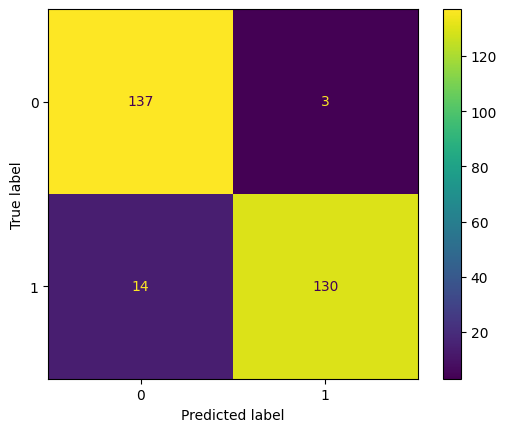

In [ ]:
print("Accuracy for SVM: ", accuracySVM)
print("Precision for SVM: ", precisionSVM)
print("Recall for SVM: ", recallSVM)
print("ROC-AUC Score for SVM: ", rocaucScoreSVM)
print("FPR Score for SVM: ", fpr[0])
print("F1 Score for SVM: ", f1ScoreSVM)
disp = ConfusionMatrixDisplay(confusion_matrix=cMatrix,
                              display_labels=svm.classes_)
disp.plot()
plt.show()

## Explanation

### Lime

In [ ]:
explainerSVM = LimeTabularExplainer(
    training_data=x_train.values,
    feature_names=list(newX.columns),
    class_names = ['0', '1'],
    mode = 'classification'
)

In [ ]:
expSVM = explainerSVM.explain_instance(
    data_row=x_test.values[0],
    predict_fn=svm.predict_proba,
    num_features=10
)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


In [ ]:
expSVM.show_in_notebook()

### Shap

  0%|          | 0/284 [00:00<?, ?it/s]

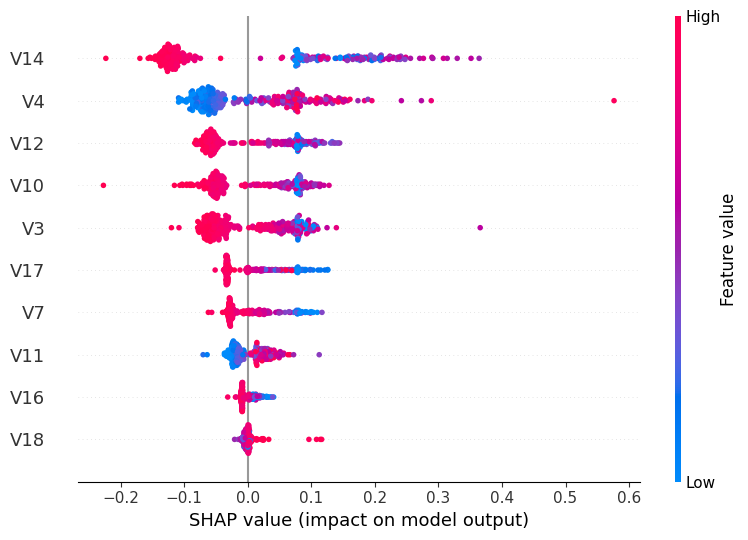

In [ ]:
explainer = shap.KernelExplainer(svm.predict, x_train)
shap_values = explainer.shap_values(x_test)
shap.summary_plot(shap_values, x_test)

### LOFO

  0%|          | 0/10 [00:00<?, ?it/s]

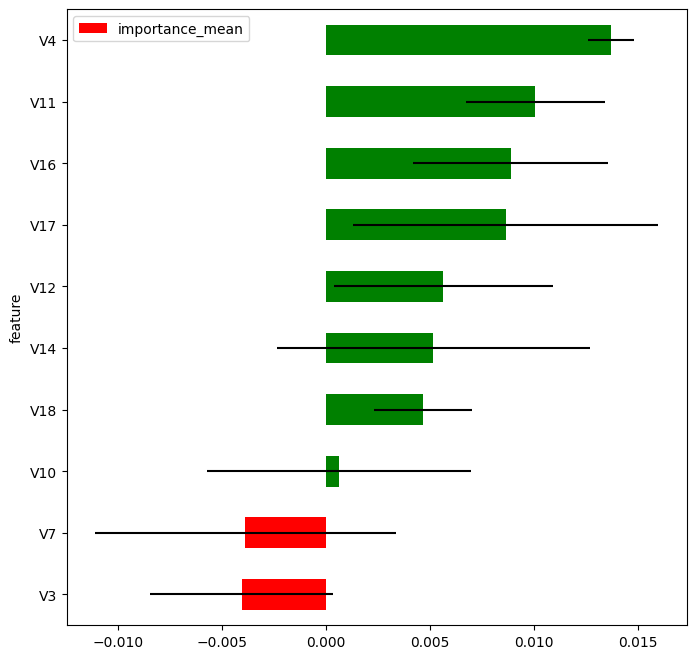

In [ ]:
scores = svm.decision_function(x_test)

lofo_dataset = Dataset(df=newDf, target="Class", features=newDf.columns.drop("Class"))
lofo_imp = LOFOImportance(
    dataset=lofo_dataset,
    model=svm,
    scoring='roc_auc',
    cv=3
)

importance_df = lofo_imp.get_importance()

plot_importance(importance_df)

### PFI

V14     0.147 +/- 0.020
V4      0.069 +/- 0.015
V12     0.067 +/- 0.015
V10     0.062 +/- 0.014
V17     0.062 +/- 0.011
V3      0.052 +/- 0.016
V7      0.051 +/- 0.012
V18     0.006 +/- 0.003


<ipython-input-28-60a16a01bd4c>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=r.importances_mean[sorted_idx], y=np.array(x_test.columns)[sorted_idx], palette="viridis")


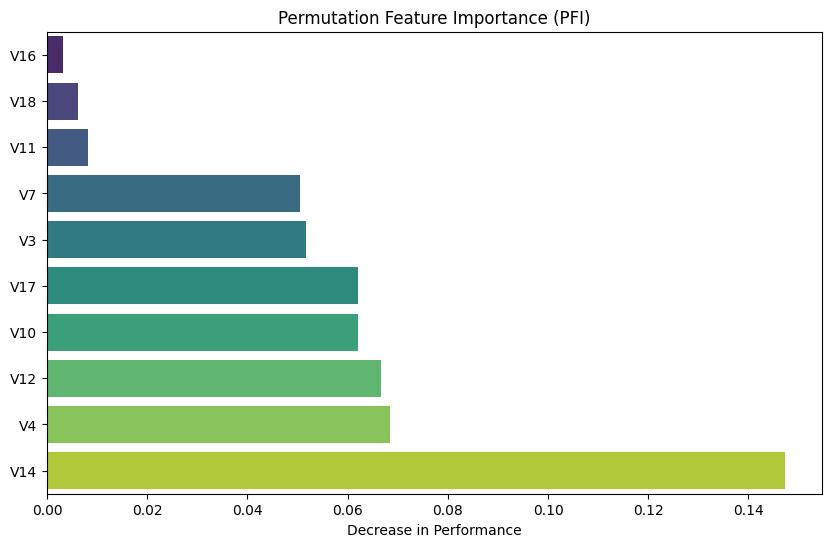

In [ ]:
r = permutation_importance(svm, x_test, y_test,
                           n_repeats=30,
                           random_state=0)

for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
        print(f"{newDf.columns[i]:<8}"
              f"{r.importances_mean[i]:.3f}"
              f" +/- {r.importances_std[i]:.3f}")


sorted_idx = np.argsort(r.importances_mean)

plt.figure(figsize=(10, 6))
sns.barplot(x=r.importances_mean[sorted_idx], y=np.array(x_test.columns)[sorted_idx], palette="viridis")
plt.xlabel("Decrease in Performance")
plt.title("Permutation Feature Importance (PFI)")
plt.show()

### ICE

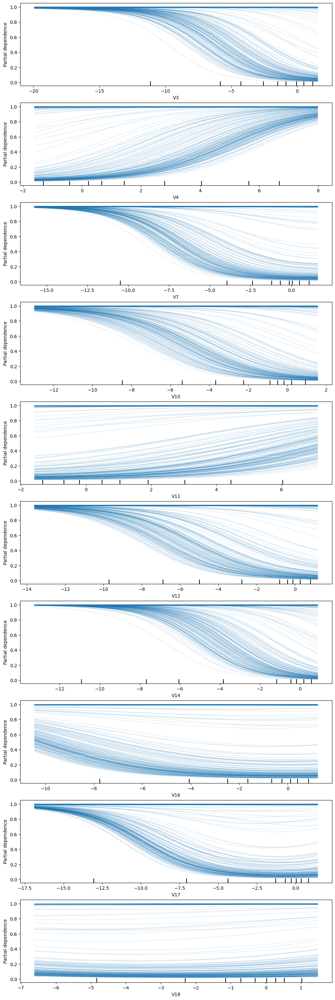

In [ ]:
_, ax = plt.subplots(ncols=1, nrows=10, figsize=(10, 30), constrained_layout=True)
display = PartialDependenceDisplay.from_estimator(
    svm,
    x_test,
    features = newX.columns,
    ax=ax,
    target=0,
    kind='individual'

)


### Global Surrogate Model

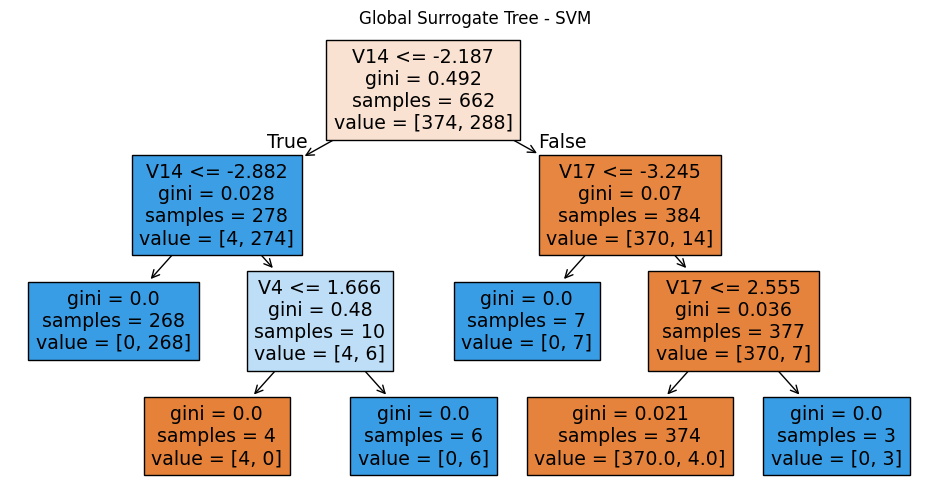

In [ ]:
surrogate = DecisionTreeClassifier(max_depth=3)
svm_preds = svm.predict(x_train)
surrogate.fit(x_train, svm_preds)


plt.figure(figsize=(12,6))
tree.plot_tree(surrogate, feature_names=newX.columns, filled=True)
plt.title("Global Surrogate Tree - SVM")
plt.show()

# Support Vector Machine (SVM) Linear Kernel

##Feature Selection

In [ ]:
fsf_selector = SelectKBest(score_func=f_classif, k=10)
X_new_fsf = fsf_selector.fit_transform(X, Y)
selected_fsf_features = X.columns[fsf_selector.get_support()]

In [ ]:
selected = list(selected_fsf_features)
selected.append("Class")
newDf = df[selected]
newX = newDf.drop(columns=["Class"])
newY = newDf["Class"]
len(newX)

283726

In [ ]:
len(newY)

283726

## UnderSampling

In [ ]:
rus = RandomUnderSampler(random_state = 42)
X_resampled, y_resampled = rus.fit_resample(newX, newY)

## Training

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42)

In [ ]:
from sklearn.svm import LinearSVC
svm = LinearSVC()
svm.fit(x_train,y_train)
predictedSVM = svm.predict(x_test)

## Results

In [ ]:
accuracySVM = accuracy_score(y_test, predictedSVM)
precisionSVM = precision_score(y_test, predictedSVM)
recallSVM = recall_score(y_test, predictedSVM)
rocaucScoreSVM = roc_auc_score(y_test, predictedSVM)
fpr, fnr, thresholds = det_curve(y_test, predictedSVM)
f1ScoreSVM = f1_score(y_test, predictedSVM)
cMatrix = confusion_matrix(y_test, predictedSVM)

Accuracy for SVM:  0.9471830985915493
Precision for SVM:  0.9708029197080292
Recall for SVM:  0.9236111111111112
ROC-AUC Score for SVM:  0.9475198412698412
FPR Score for SVM:  1.0
F1 Score for SVM:  0.9466192170818505


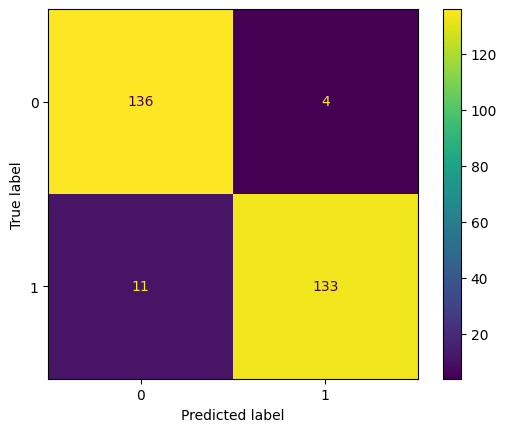

In [ ]:
print("Accuracy for SVM: ", accuracySVM)
print("Precision for SVM: ", precisionSVM)
print("Recall for SVM: ", recallSVM)
print("ROC-AUC Score for SVM: ", rocaucScoreSVM)
print("FPR Score for SVM: ", fpr[0])
print("F1 Score for SVM: ", f1ScoreSVM)
disp = ConfusionMatrixDisplay(confusion_matrix=cMatrix,
                              display_labels=svm.classes_)
disp.plot()
plt.show()

## Explanation

### Lime

In [ ]:
explainerSVM = LimeTabularExplainer(
    training_data=x_train.values,
    feature_names=list(newX.columns),
    class_names = ['0', '1'],
    mode = 'classification'
)

In [ ]:
from sklearn.calibration import CalibratedClassifierCV

model = CalibratedClassifierCV(LinearSVC())
model.fit(x_train, y_train)
expSVM = explainerSVM.explain_instance(
    data_row=x_test.values[0],
    predict_fn=model.predict_proba,
    num_features=10
)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearSVC was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearSVC was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearSVC was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearSVC was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearSVC was fitted with feature names
  warnings.warn(


In [ ]:
expSVM.show_in_notebook()

### Shap

  0%|          | 0/284 [00:00<?, ?it/s]

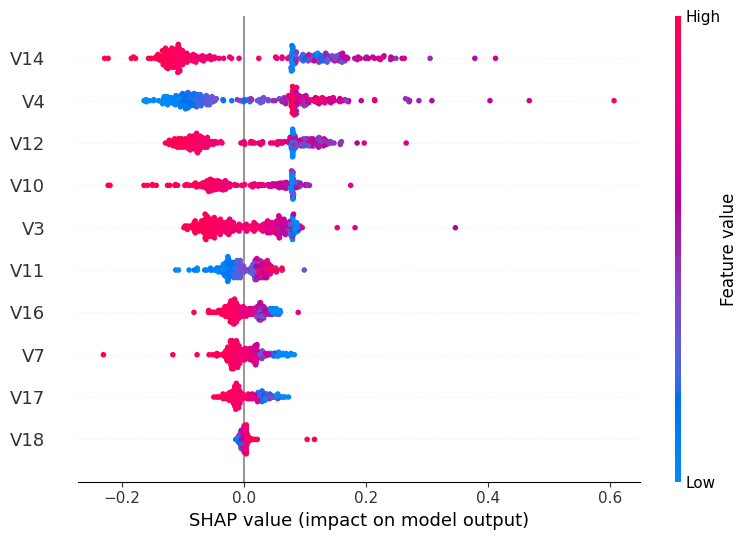

In [ ]:
explainer = shap.KernelExplainer(svm.predict, x_train)
shap_values = explainer.shap_values(x_test)
shap.summary_plot(shap_values, x_test)

### LOFO

  0%|          | 0/10 [00:00<?, ?it/s]

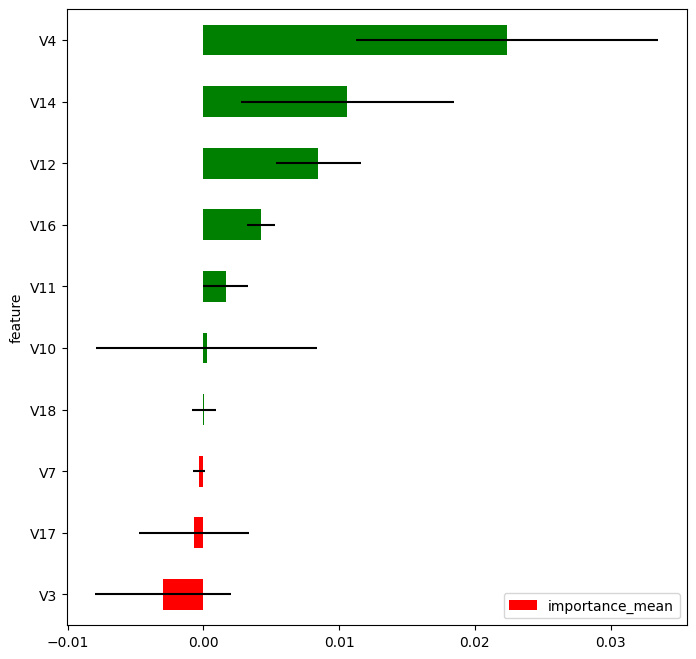

In [ ]:
scores = svm.decision_function(x_test)

lofo_dataset = Dataset(df=newDf, target="Class", features=newDf.columns.drop("Class"))
lofo_imp = LOFOImportance(
    dataset=lofo_dataset,
    model=svm,
    scoring='roc_auc',
    cv=3
)

importance_df = lofo_imp.get_importance()

plot_importance(importance_df)

### PFI

V14     0.190 +/- 0.017
V4      0.142 +/- 0.018
V12     0.141 +/- 0.015
V10     0.092 +/- 0.015
V3      0.075 +/- 0.017
V7      0.032 +/- 0.009
V17     0.022 +/- 0.011


<ipython-input-100-60a16a01bd4c>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=r.importances_mean[sorted_idx], y=np.array(x_test.columns)[sorted_idx], palette="viridis")


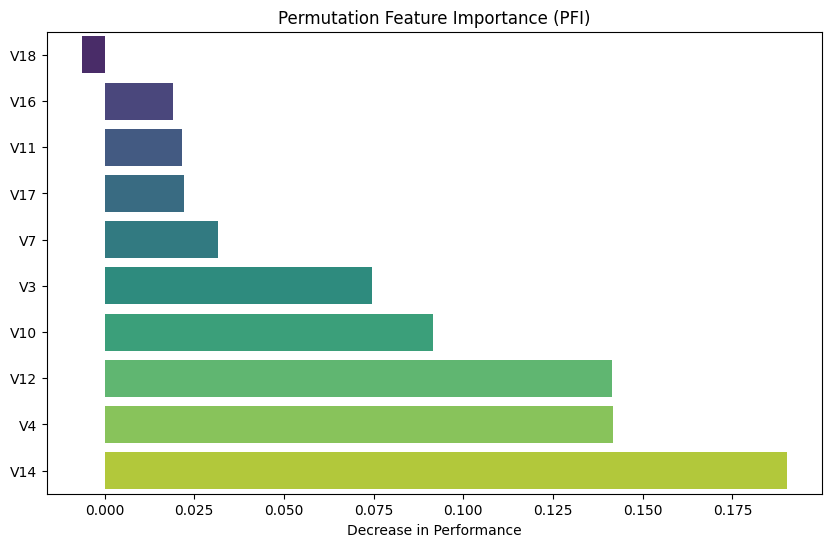

In [ ]:
r = permutation_importance(svm, x_test, y_test,
                           n_repeats=30,
                           random_state=0)

for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
        print(f"{newDf.columns[i]:<8}"
              f"{r.importances_mean[i]:.3f}"
              f" +/- {r.importances_std[i]:.3f}")


sorted_idx = np.argsort(r.importances_mean)

plt.figure(figsize=(10, 6))
sns.barplot(x=r.importances_mean[sorted_idx], y=np.array(x_test.columns)[sorted_idx], palette="viridis")
plt.xlabel("Decrease in Performance")
plt.title("Permutation Feature Importance (PFI)")
plt.show()

### ICE

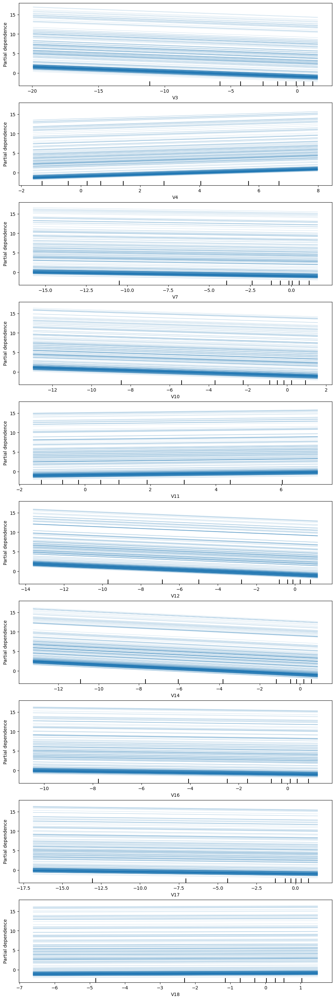

In [ ]:
_, ax = plt.subplots(ncols=1, nrows=10, figsize=(10, 30), constrained_layout=True)
display = PartialDependenceDisplay.from_estimator(
    svm,
    x_test,
    features = newX.columns,
    ax=ax,
    target=0,
    kind='individual'

)


### Global Surrogate Model

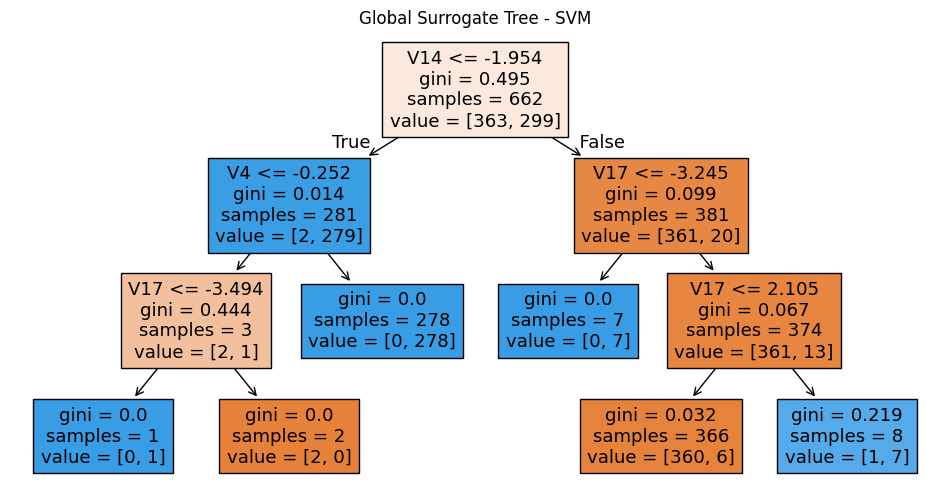

In [ ]:
surrogate = DecisionTreeClassifier(max_depth=3)
svm_preds = svm.predict(x_train)
surrogate.fit(x_train, svm_preds)


plt.figure(figsize=(12,6))
tree.plot_tree(surrogate, feature_names=newX.columns, filled=True)
plt.title("Global Surrogate Tree - SVM")
plt.show()